In [76]:
#!pip install sentence_transformers

In [77]:
import pandas as pd
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

In [78]:
reviews = pd.read_csv('/content/RGrocery_df.csv')
reviews.groupby('LABEL')
reviews.head(5)

,Unnamed: 0,DOC_ID,LABEL,RATING,VERIFIED_PURCHASE,PRODUCT_CATEGORY,PRODUCT_ID,PRODUCT_TITLE,REVIEW_TITLE,REVIEW_TEXT
0,75,76,__label1__,1,N,Grocery,B005DVUTIO,"Campbell's Slow Kettle Style Soup, Tomato & Sw...",not sold,I'm not really sold on the flavor and texture ...
1,162,163,__label1__,4,N,Grocery,B00014JNI0,YS Organic Bee Farms CERTIFIED ORGANIC RAW HON...,I love honey.,I have been taking honey from when i was a chi...
2,192,193,__label1__,4,N,Grocery,B005PN6A4W,"Kashi Trail Mix Chewy Granola Bars, 22.1 -Ounce","Very tasty, not too sweet",These are the lowest calorie bar with the high...
3,196,197,__label1__,4,N,Grocery,B000ER3EFC,"Earth's Best Organic Stage 2, Sweet Potatoes, ...",good product,"Ok, no one tell my son this....but, I actually..."
4,257,258,__label1__,4,N,Grocery,B003VFJK6G,Blue Raspberry Jolly Ranchers 160 pieces,Blues are the best!,Ahhh!! Im so happy to have found just blue jol...


In [79]:
df=reviews['LABEL']
label=list(df)
label_1=[]
label_2=[]
for i in range(0,700):
    if label[i]=='__label1__':
        label_1.append(label[i])
    else:
        label_2.append(label[i])



In [80]:
sentences = reviews['REVIEW_TEXT']

In [81]:
model = SentenceTransformer('bert-base-nli-mean-tokens')

In [82]:
sentence_vecs = model.encode(sentences)

In [83]:
arr=cosine_similarity(sentence_vecs,sentence_vecs)

In [84]:
node_1 = []
node_2 = []
for u in range(0,700) :
    for v in range(0,700) :
        if u!=v and arr[u,v]>0.75:
            node_1.append(reviews['REVIEW_TITLE'].loc[u])
            node_2.append(reviews['REVIEW_TITLE'].loc[v])
        else:
            node_1.append(reviews['REVIEW_TITLE'].loc[u])
            node_2.append(1)

In [85]:
df = pd.DataFrame(list(zip(node_1, node_2)),
               columns =['Column1', 'Column2'])
df

,Column1,Column2
0,not sold,1
1,not sold,1
2,not sold,1
3,not sold,1
4,not sold,1
...,...,...
489995,Best English Muffin I've ever had (and that go...,this stuff is amazing! I was worried that it w...
489996,Best English Muffin I've ever had (and that go...,1
489997,Best English Muffin I've ever had (and that go...,1
489998,Best English Muffin I've ever had (and that go...,1


In [86]:
import networkx as nx
G = nx.Graph()
import matplotlib.pyplot as plt

In [87]:
G = nx.from_pandas_edgelist(df, 'Column1', 'Column2')

In [88]:
G.remove_node(1)

In [89]:
nx.info(G)
num=G.number_of_nodes()

In [90]:
degrees1 = {node:val for (node, val) in G.degree()}
x= list(degrees1.keys())
val= list(degrees1.values())

In [91]:
li1=[]
li2=[]
for i in range(num):
    temp=0
    for j in range(700):
        if x[i]==reviews['REVIEW_TITLE'].iloc[j]:
            temp=reviews.iloc[j]['LABEL']
    if temp=='__label1__':
        li1.append('red')
    else:
        li2.append('green')

c=li1 + li2
len(c)

683

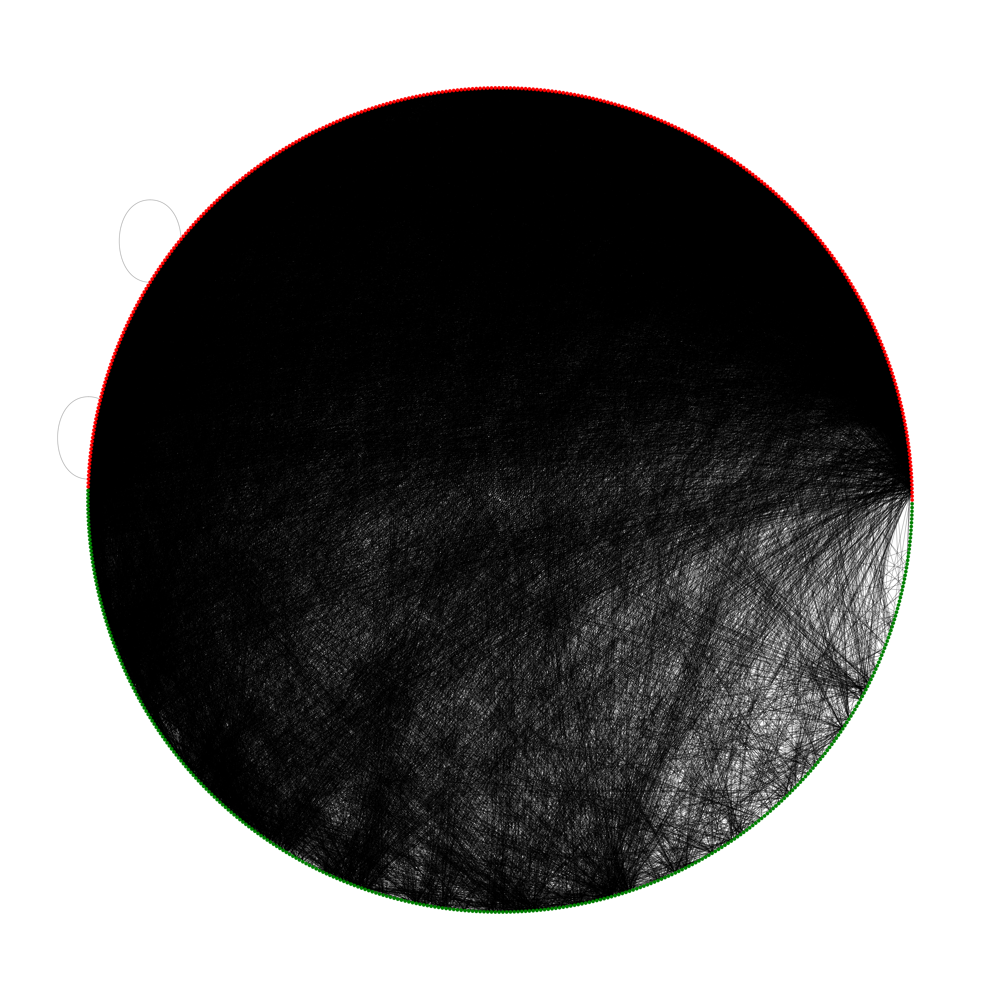

'plt.savefig("GCcommonGraph_0.75.jpg")\nplt.savefig("GCcommonGraph_0.75.png", format="PNG")\nnx.write_gml(G,\'GCcommonGraph_0.75.gml\')\nfrom google.colab import files\nfiles.download(\'GCcommonGraph_0.75.gml\')'

In [100]:
from matplotlib.pyplot import figure
figure(figsize=(70,70))
nx.draw_circular(G,node_color=c)
plt.show()
'''plt.savefig("GCcommonGraph_0.75.jpg")
plt.savefig("GCcommonGraph_0.75.png", format="PNG")
nx.write_gml(G,'GCcommonGraph_0.75.gml')
from google.colab import files
files.download('GCcommonGraph_0.75.gml')'''


In [93]:
nx.density(G)

0.11110204677483759

In [94]:
nx.number_connected_components(G)

19

In [95]:
real=list(dict(G.degree()).values())
from statistics import mean
mean(real)

75.77159590043924

In [96]:
nx.average_clustering(G)

0.5282862563442542

In [97]:
nx.transitivity(G)

0.4683309101071526